# 1. Motivation
### What is your dataset?

In this project, we are looking at **New York City** and its **gentrification**. We used 2 datasets: the *Property Valuation and Assessment Data* and the *NYPD Arrests Data (Historic)*. 

In the *Property* dataset we are mostly focused on the *FULLVAL* column since it is the one with the information about the prices of properties. We also grouped the values per ZIP code, in order to later use them in a map of New York.

In the *Crime* dataset, we focused on 4 crimes from the *OFNS_DESC* column: *Rape*, *Murder & Non-negligent men slaughter*, *Robbery* and *Dangerous Weapons*. We wanted to gather data about the most violent crimes.

In [22]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import folium
from folium import plugins
from folium.plugins import HeatMap
import json
import requests
import branca


from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import model_selection
from IPython.display import Image
from sklearn.metrics import accuracy_score

from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure
from bokeh import plotting
from bokeh.models import FactorRange
from bokeh.transform import dodge
from bokeh.models import Legend
from bokeh.palettes import Category20c

In [4]:
# Import property data
data = pd.read_csv("Property_Valuation_and_Assessment_Data.csv") 
df = pd.DataFrame(data)

# Import crime data
data_crime = pd.read_csv("NYPD_Arrests_Data__Historic_.csv") 
df_crime = pd.DataFrame(data_crime)

#Show overview
print(df.head())
print(df_crime.head())

         BBLE  BORO  BLOCK  LOT EASEMENT                  OWNER BLDGCL  \
0  1000010010     1      1   10      NaN  GOVERNORS ISLAND CORP     Y4   
1  1000010101     1      1  101      NaN  U S GOVT LAND & BLDGS     P7   
2  1000010201     1      1  201      NaN  U S GOVT LAND & BLDGS     Z9   
3  1000010301     1      1  301      NaN                    NaN     U0   
4  1000010401     1      1  401      NaN                    NaN     U0   

  TAXCLASS  LTFRONT  LTDEPTH  ...     YEAR  VALTYPE    Borough   Latitude  \
0        4      177        0  ...  2018/19    AC-TR  MANHATTAN  40.690096   
1        4      500     1046  ...  2018/19    AC-TR  MANHATTAN  40.689887   
2        4       63        0  ...  2018/19    AC-TR  MANHATTAN  40.698831   
3        4        0        0  ...  2018/19    AC-TR        NaN        NaN   
4        4        0        0  ...  2018/19    AC-TR        NaN        NaN   

   Longitude  Community Board  Council District  Census Tract        BIN  \
0 -74.012866    

### Why did you choose this/these particular datasets?

We started with a question: *What factors, visible in open datasets, could be correlated with gentrification?*. Some of our hypothesis were "the evolution of price of property in a zone" and "the overall safety of a zone". In this project, we want to confirm or reject our suppositions, and try to show what they represent through visualization. 

The *Property* and *Crime* datasets gives usefull information to answer these questions, and they range from 2010 to 2019, wich is an acceptable span of time to observe evolution and changes.

### What was your goal for the end user's experience?

We want the user to learn about gentrification and some of its manifestations in New York. We want the user to be able to interact with our visualizations in order to have a more engaging experience. Our goal is to clearly communicate our findings and letting space for the user to explore our visual story. 

# 2. Basic statistcs
### Write about your choices in data cleaning and preprocessing

At first we had a 2 GB data set of the property values with a lot different variables that were not relevant to our study, so we started by removing from the dataframe all the useless columns (such as "owner", "block" or "taxclass"). Afterwards we needed to ensure that every row was complete, and that there was no cell holding ‘NaN’, to do so we just apply the method dropna() on our dataframe. At that point we almost have a fully ready dataframe, we then just needed to ensure that all the variables have the desired type, such as the zip codes that should be integers as the year variable. And we also ensured that the values of the properties were in the type float.

(Add code)

We then conduct a similar cleaning and processing on the crime data set that we’re using. We first identify only the crimes that are relevant to our study and the filter out all the other crimes, in our case we get interested in the crimes : Robbery, Dangerous weapons, Rape and Murder associated with non negligent men slaughter. The objective of this data set was primarily to produce a movie with a heat map, therefore we first create a new column associated to each crime representing the year the arrestation has been made, and thus afterwards we filter out our data even more in order to have a data frame at the end containing only the year (as an integer), and the longitude and latitude as a float.



In [6]:
newdata=data.drop(['BBLE', 'BORO','BLOCK','LOT','EASEMENT','OWNER','BLDGCL','LTFRONT','LTDEPTH','TAXCLASS','EXT','STORIES','AVLAND','AVTOT', 'EXLAND', 'EXTOT', 'EXCD1', 'STADDR', 'EXMPTCL',
       'BLDFRONT', 'BLDDEPTH', 'AVLAND2', 'AVTOT2', 'EXLAND2', 'EXTOT2',
       'EXCD2','BIN', 'NTA','PERIOD','Community Board', 'Council District', 'Census Tract'], axis=1)

new1=newdata.dropna()
new2=new1.reset_index(drop=True)

df_crime["ARREST_DATE"]=pd.to_datetime(df_crime["ARREST_DATE"])
df_crime=df_crime.assign(Year=df_crime["ARREST_DATE"].dt.year)

focus_crimes=['ROBBERY','RAPE','DANGEROUS WEAPONS']
focus_borough=['Q','K','M','S','B']

df_focus = df_crime[df_crime["OFNS_DESC"].isin(focus_crimes)]
df_focus = df_focus[df_focus["ARREST_BORO"].isin(focus_borough)]
df_focus=df_focus.reset_index()
"""
Q:Queens
K:Brooklyn
M:Manhattan
S:Staten Island
B:Bronx

"""



'\nQ:Queens\nK:Brooklyn\nM:Manhattan\nS:Staten Island\nB:Bronx\n\n'

### Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis. 

 Let’s consider first the dataset about property valuation; it is made out of  9845857 rows and 39 columns. After cleaning the dataset , we start the exploration of the data. Since we have the prices of every property and the different boroughs in which they are created, we first want to establish globally over the whole dataset what is the average price in each borough of property.

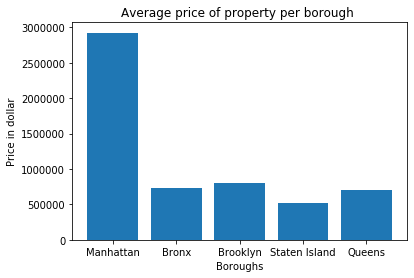

In [7]:
Man=new2[new2['Borough']=='MANHATTAN']['FULLVAL'].mean()
Bro=new2[new2['Borough']=='BRONX']['FULLVAL'].mean()
Bkl=new2[new2['Borough']=='BROOKLYN']['FULLVAL'].mean()
Stn=new2[new2['Borough']=='STATEN IS']['FULLVAL'].mean()
Que=new2[new2['Borough']=='QUEENS']['FULLVAL'].mean()


listeav=[Man,Bro,Bkl,Stn,Que]


Borou=['Manhattan','Bronx','Brooklyn','Staten Island','Queens']


plt.figure()
plt.bar(Borou,listeav)
plt.title('Average price of property per borough ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()

As seen in the plot and with no surprise Manhattan has the highest values almost 4 times bigger than Brooklyn which holds the second highest value. This plot is interesting to get a general idea, but we need to go deeper in the analysis especially considering the fact that we have the date at which every property valuation has been recorded. So we get interested in exploring the same type of plot, but this time instead of having a global vision over the years, we create 9 different plots corresponding to the 9 different years that spans our data set (2010-2019) in order to find some evolution trends. 

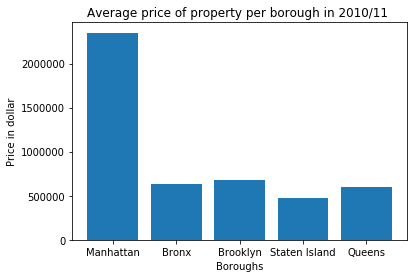

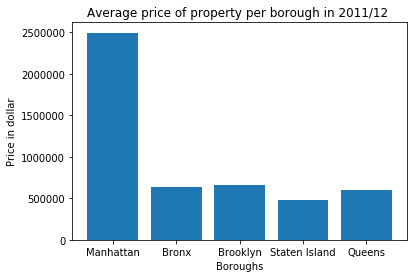

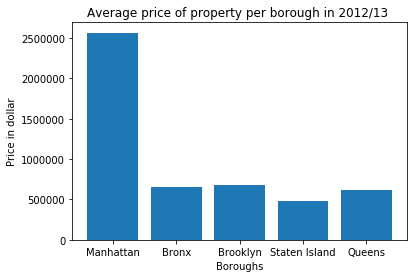

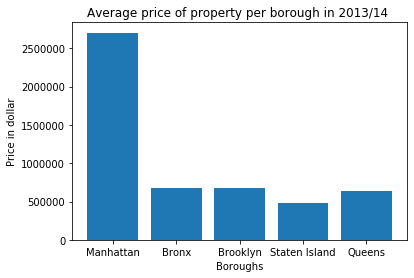

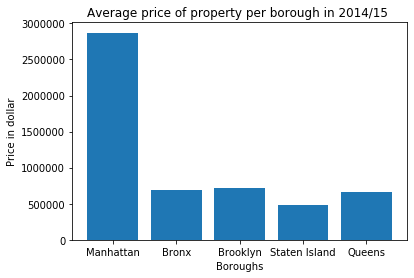

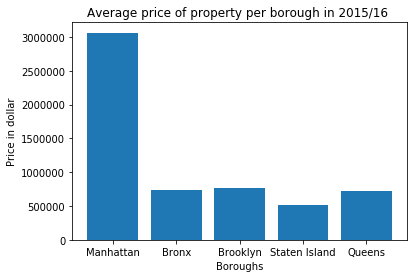

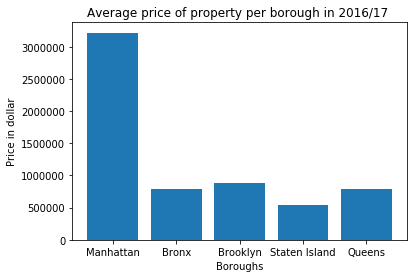

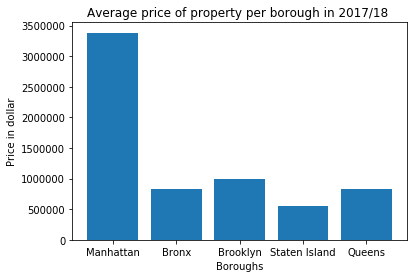

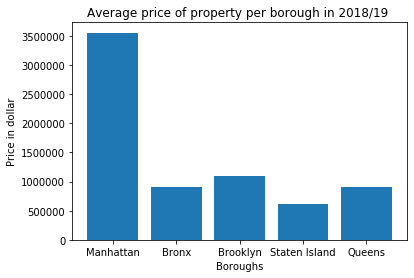

In [8]:
Datayear1=new2[new2['YEAR']=='2010/11']
Datayear2=new2[new2['YEAR']=='2011/12']
Datayear3=new2[new2['YEAR']=='2012/13']
Datayear4=new2[new2['YEAR']=='2013/14']
Datayear5=new2[new2['YEAR']=='2014/15']
Datayear6=new2[new2['YEAR']=='2015/16']
Datayear7=new2[new2['YEAR']=='2016/17']
Datayear8=new2[new2['YEAR']=='2017/18']
Datayear9=new2[new2['YEAR']=='2018/19']



a=Datayear1[Datayear1['Borough']=='MANHATTAN']['FULLVAL'].mean()
b=Datayear1[Datayear1['Borough']=='BRONX']['FULLVAL'].mean()
c=Datayear1[Datayear1['Borough']=='BROOKLYN']['FULLVAL'].mean()
d=Datayear1[Datayear1['Borough']=='STATEN IS']['FULLVAL'].mean()
e=Datayear1[Datayear1['Borough']=='QUEENS']['FULLVAL'].mean()


plt.figure()
plt.bar(Borou,[a,b,c,d,e])
plt.title('Average price of property per borough in 2010/11 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()


a2=Datayear2[Datayear2['Borough']=='MANHATTAN']['FULLVAL'].mean()
b2=Datayear2[Datayear2['Borough']=='BRONX']['FULLVAL'].mean()
c2=Datayear2[Datayear2['Borough']=='BROOKLYN']['FULLVAL'].mean()
d2=Datayear2[Datayear2['Borough']=='STATEN IS']['FULLVAL'].mean()
e2=Datayear2[Datayear2['Borough']=='QUEENS']['FULLVAL'].mean()


plt.figure()
plt.bar(Borou,[a2,b2,c2,d2,e2])
plt.title('Average price of property per borough in 2011/12 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()


a3=Datayear3[Datayear3['Borough']=='MANHATTAN']['FULLVAL'].mean()
b3=Datayear3[Datayear3['Borough']=='BRONX']['FULLVAL'].mean()
c3=Datayear3[Datayear3['Borough']=='BROOKLYN']['FULLVAL'].mean()
d3=Datayear3[Datayear3['Borough']=='STATEN IS']['FULLVAL'].mean()
e3=Datayear3[Datayear3['Borough']=='QUEENS']['FULLVAL'].mean()

plt.figure()
plt.bar(Borou,[a3,b3,c3,d3,e3])
plt.title('Average price of property per borough in 2012/13 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()


a4=Datayear4[Datayear4['Borough']=='MANHATTAN']['FULLVAL'].mean()
b4=Datayear4[Datayear4['Borough']=='BRONX']['FULLVAL'].mean()
c4=Datayear4[Datayear4['Borough']=='BROOKLYN']['FULLVAL'].mean()
d4=Datayear4[Datayear4['Borough']=='STATEN IS']['FULLVAL'].mean()
e4=Datayear4[Datayear4['Borough']=='QUEENS']['FULLVAL'].mean()


plt.figure()
plt.bar(Borou,[a4,b4,c4,d4,e4])
plt.title('Average price of property per borough in 2013/14 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()

a5=Datayear5[Datayear5['Borough']=='MANHATTAN']['FULLVAL'].mean()
b5=Datayear5[Datayear5['Borough']=='BRONX']['FULLVAL'].mean()
c5=Datayear5[Datayear5['Borough']=='BROOKLYN']['FULLVAL'].mean()
d5=Datayear5[Datayear5['Borough']=='STATEN IS']['FULLVAL'].mean()
e5=Datayear5[Datayear5['Borough']=='QUEENS']['FULLVAL'].mean()

plt.figure()
plt.bar(Borou,[a5,b5,c5,d5,e5])
plt.title('Average price of property per borough in 2014/15 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()

a6=Datayear6[Datayear6['Borough']=='MANHATTAN']['FULLVAL'].mean()
b6=Datayear6[Datayear6['Borough']=='BRONX']['FULLVAL'].mean()
c6=Datayear6[Datayear6['Borough']=='BROOKLYN']['FULLVAL'].mean()
d6=Datayear6[Datayear6['Borough']=='STATEN IS']['FULLVAL'].mean()
e6=Datayear6[Datayear6['Borough']=='QUEENS']['FULLVAL'].mean()

plt.figure()
plt.bar(Borou,[a6,b6,c6,d6,e6])
plt.title('Average price of property per borough in 2015/16 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()

a7=Datayear7[Datayear7['Borough']=='MANHATTAN']['FULLVAL'].mean()
b7=Datayear7[Datayear7['Borough']=='BRONX']['FULLVAL'].mean()
c7=Datayear7[Datayear7['Borough']=='BROOKLYN']['FULLVAL'].mean()
d7=Datayear7[Datayear7['Borough']=='STATEN IS']['FULLVAL'].mean()
e7=Datayear7[Datayear7['Borough']=='QUEENS']['FULLVAL'].mean()

plt.figure()
plt.bar(Borou,[a7,b7,c7,d7,e7])
plt.title('Average price of property per borough in 2016/17 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()

a8=Datayear8[Datayear8['Borough']=='MANHATTAN']['FULLVAL'].mean()
b8=Datayear8[Datayear8['Borough']=='BRONX']['FULLVAL'].mean()
c8=Datayear8[Datayear8['Borough']=='BROOKLYN']['FULLVAL'].mean()
d8=Datayear8[Datayear8['Borough']=='STATEN IS']['FULLVAL'].mean()
e8=Datayear8[Datayear8['Borough']=='QUEENS']['FULLVAL'].mean()

plt.figure()
plt.bar(Borou,[a8,b8,c8,d8,e8])
plt.title('Average price of property per borough in 2017/18 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()

a9=Datayear9[Datayear9['Borough']=='MANHATTAN']['FULLVAL'].mean()
b9=Datayear9[Datayear9['Borough']=='BRONX']['FULLVAL'].mean()
c9=Datayear9[Datayear9['Borough']=='BROOKLYN']['FULLVAL'].mean()
d9=Datayear9[Datayear9['Borough']=='STATEN IS']['FULLVAL'].mean()
e9=Datayear9[Datayear9['Borough']=='QUEENS']['FULLVAL'].mean()

plt.figure()
plt.bar(Borou,[a9,b9,c9,d9,e9])
plt.title('Average price of property per borough in 2018/19 ')
plt.xlabel('Boroughs')
plt.ylabel('Price in dollar')
plt.show()

We observe a general tendency for every borough to have an increase in its average property value each year - which makes sense as it is right after the end of the subprime crisis. To emphasize this increasing trend we plot the curves for prices for each Borough in function of the years leading to the following overview:

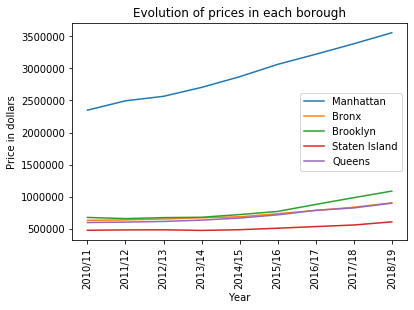

In [9]:
figyea=['2010/11','2011/12','2012/13','2013/14','2014/15','2015/16','2016/17','2017/18','2018/19']

fig, ax = plt.subplots()
ax.plot(figyea,[a,a2,a3,a4,a5,a6,a7,a8,a9],label='Manhattan')
ax.plot(figyea,[b,b2,b3,b4,b5,b6,b7,b8,b9],label='Bronx')
ax.plot(figyea,[c,c2,c3,c4,c5,c6,c7,c8,c9],label='Brooklyn')
ax.plot(figyea,[d,d2,d3,d4,d5,d6,d7,d8,d9],label='Staten Island')
ax.plot(figyea,[e,e2,e3,e4,e5,e6,e7,e8,e9],label='Queens')
plt.title('Evolution of prices in each borough')
ax.legend()
plt.xticks(rotation=90)
plt.xlabel('Year')
plt.ylabel('Price in dollars')

plt.show()




And the final key point to explore the data is to plot the difference in percentage each year in each borough leading to the following plots:

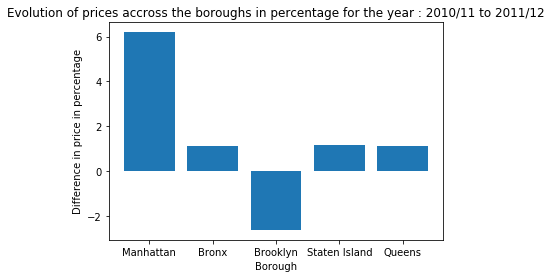

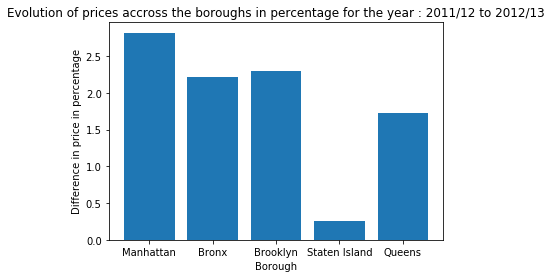

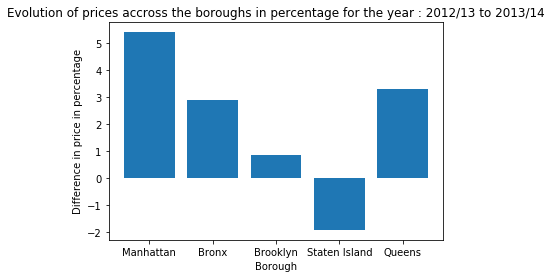

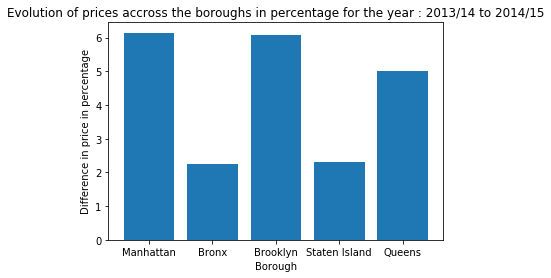

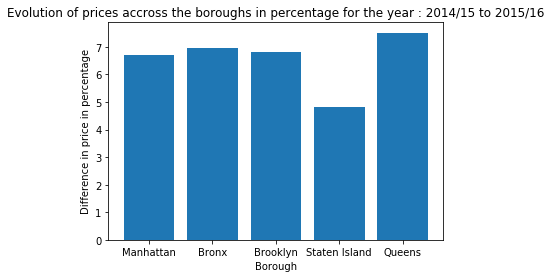

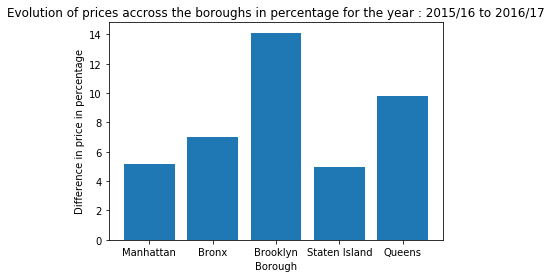

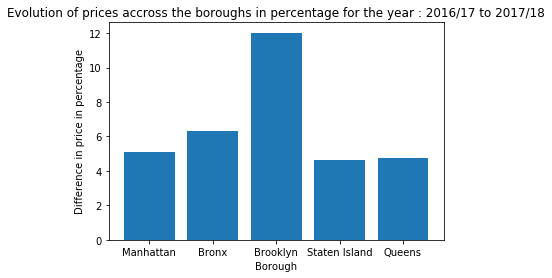

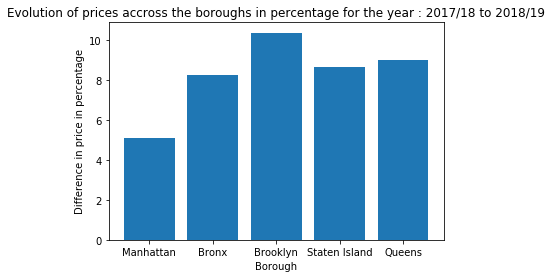

In [10]:
As = [a,a2,a3,a4,a5,a6,a7,a8,a9]
Bs = [b,b2,b3,b4,b5,b6,b7,b8,b9]
Cs = [c,c2,c3,c4,c5,c6,c7,c8,c9]
Ds = [d,d2,d3,d4,d5,d6,d7,d8,d9]
Es = [e,e2,e3,e4,e5,e6,e7,e8,e9]

dates=['2010/11','2011/12','2012/13','2013/14','2014/15','2015/16','2016/17','2017/18','2018/19']

moyperyear=[]


for x in range(8):
    moyperyear.append((100*((As[x+1]-As[x])/As[x])+100*((Bs[x+1]-Bs[x])/Bs[x])+100*((Cs[x+1]-Cs[x])/Cs[x])+100*((Ds[x+1]-Ds[x])/Ds[x])+100*((Es[x+1]-Es[x])/Es[x]))/5)
    plt.figure()
    plt.bar(Borou,[100*((As[x+1]-As[x])/As[x]),100*((Bs[x+1]-Bs[x])/Bs[x]),100*((Cs[x+1]-Cs[x])/Cs[x]),100*((Ds[x+1]-Ds[x])/Ds[x]),100*((Es[x+1]-Es[x])/Es[x])])
    plt.xlabel('Borough')
    plt.ylabel('Difference in price in percentage')
    plt.title('Evolution of prices accross the boroughs in percentage for the year : '+dates[x]+' to '+dates[x+1])
    plt.show()

Our Gentrification hypothesis also led us into analysing the crime data set of new-york spanning the same years as our property valuation data set. Before trying to observe any correlations in between the two datasets we create some key plots for understanding better the data set, we choose to only consider violent crimes as we expect mostly those type of crimes to lower in the neighborhoods affected by gentrification. We therefore create first a collection of plots representing the count of each type of crime we consider in each of the boroughs and a pie chart representing the distribution of each type of crime in our data set :

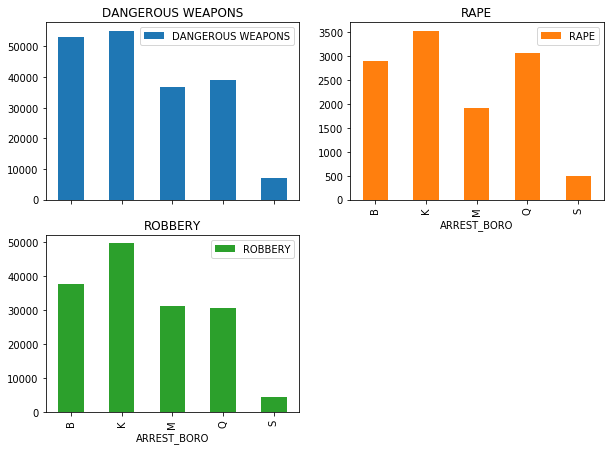

In [11]:
df_avg=df_focus.drop(['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD',
       'LAW_CODE', 'LAW_CAT_CD', 'ARREST_PRECINCT',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'X_COORD_CD',
       'Y_COORD_CD'],axis=1)
crime_focus_count=df_avg.groupby(['ARREST_BORO','OFNS_DESC'])['index'].count()
ax = crime_focus_count.unstack().plot.bar(subplots = True, layout=(4,2), figsize = (10,15))


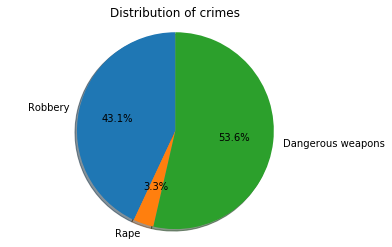

In [13]:
df_avg_rob=len(df_avg[df_avg['OFNS_DESC']==focus_crimes[0]])
df_avg_rape=len(df_avg[df_avg['OFNS_DESC']==focus_crimes[1]])
df_avg_weap=len(df_avg[df_avg['OFNS_DESC']==focus_crimes[2]])
perce=[100*df_avg_rob/len(df_avg),100*df_avg_rape/len(df_avg),100*df_avg_weap/len(df_avg)]
labels='Robbery','Rape','Dangerous weapons'
explode = (0, 0, 0)

fig1, ax1 = plt.subplots()
ax1.pie(perce, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of crimes')
plt.show()






These plots gives us a general idea on what are the most violent boroughs of New york, but we want to see afterwards if throughout the years there has been an improvement or not of the different type of crimes, therefore we create the following bar charts illustrating the percentage difference for each type of crime in each borough each year: 

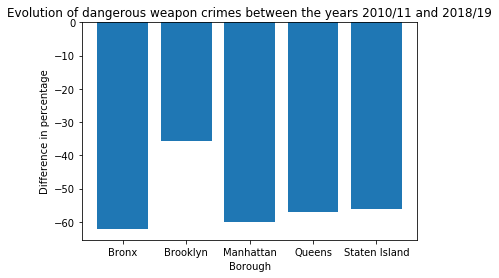

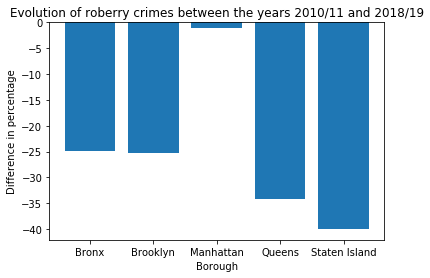

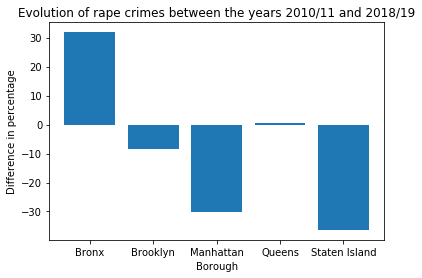

In [12]:
df_avg1 = df_avg[df_avg["Year"]==2010]
df_avg2 = df_avg[df_avg["Year"]==2019]

df_avg1_weap = df_avg1[df_avg1["OFNS_DESC"]=='DANGEROUS WEAPONS']
df_avg1_rob = df_avg1[df_avg1["OFNS_DESC"]=='ROBBERY']
df_avg1_rape = df_avg1[df_avg1["OFNS_DESC"]=='RAPE']

df_avg2_weap = df_avg2[df_avg2["OFNS_DESC"]=='DANGEROUS WEAPONS']
df_avg2_rob = df_avg2[df_avg2["OFNS_DESC"]=='ROBBERY']
df_avg2_rape = df_avg2[df_avg2["OFNS_DESC"]=='RAPE']


crime_focus_count_weap1=df_avg1_weap.groupby(['ARREST_BORO','OFNS_DESC'])['index'].count()
crime_focus_count_rob1=df_avg1_rob.groupby(['ARREST_BORO','OFNS_DESC'])['index'].count()
crime_focus_count_rape1=df_avg1_rape.groupby(['ARREST_BORO','OFNS_DESC'])['index'].count()

crime_focus_count_weap2=df_avg2_weap.groupby(['ARREST_BORO','OFNS_DESC'])['index'].count()
crime_focus_count_rob2=df_avg2_rob.groupby(['ARREST_BORO','OFNS_DESC'])['index'].count()
crime_focus_count_rape2=df_avg2_rape.groupby(['ARREST_BORO','OFNS_DESC'])['index'].count()

plt.figure()
plt.bar(['Bronx','Brooklyn','Manhattan','Queens','Staten Island'],
       [100*(crime_focus_count_weap2[0]-crime_focus_count_weap1[0])/crime_focus_count_weap1[0],
       100*(crime_focus_count_weap2[1]-crime_focus_count_weap1[1])/crime_focus_count_weap1[1],
       100*(crime_focus_count_weap2[2]-crime_focus_count_weap1[2])/crime_focus_count_weap1[2],
       100*(crime_focus_count_weap2[3]-crime_focus_count_weap1[3])/crime_focus_count_weap1[3],
       100*(crime_focus_count_weap2[4]-crime_focus_count_weap1[4])/crime_focus_count_weap1[4]])
plt.xlabel('Borough')
plt.ylabel('Difference in percentage')
plt.title('Evolution of dangerous weapon crimes between the years 2010/11 and 2018/19')

plt.show()

plt.figure()
plt.bar(['Bronx','Brooklyn','Manhattan','Queens','Staten Island'],
       [100*(crime_focus_count_rob2[0]-crime_focus_count_rob1[0])/crime_focus_count_rob1[0],
       100*(crime_focus_count_rob2[1]-crime_focus_count_rob1[1])/crime_focus_count_rob1[1],
       100*(crime_focus_count_rob2[2]-crime_focus_count_rob1[2])/crime_focus_count_rob1[2],
       100*(crime_focus_count_rob2[3]-crime_focus_count_rob1[3])/crime_focus_count_rob1[3],
       100*(crime_focus_count_rob2[4]-crime_focus_count_rob1[4])/crime_focus_count_rob1[4]])
plt.xlabel('Borough')
plt.ylabel('Difference in percentage')
plt.title('Evolution of roberry crimes between the years 2010/11 and 2018/19')
plt.show()

plt.figure()
plt.bar(['Bronx','Brooklyn','Manhattan','Queens','Staten Island'],
       [100*(crime_focus_count_rape2[0]-crime_focus_count_rape1[0])/crime_focus_count_rape1[0],
       100*(crime_focus_count_rape2[1]-crime_focus_count_rape1[1])/crime_focus_count_rape1[1],
       100*(crime_focus_count_rape2[2]-crime_focus_count_rape1[2])/crime_focus_count_rape1[2],
       100*(crime_focus_count_rape2[3]-crime_focus_count_rape1[3])/crime_focus_count_rape1[3],
       100*(crime_focus_count_rape2[4]-crime_focus_count_rape1[4])/crime_focus_count_rape1[4]])
plt.xlabel('Borough')
plt.ylabel('Difference in percentage')
plt.title('Evolution of rape crimes between the years 2010/11 and 2018/19')
plt.show()



# 3. Data Analysis. 

### Describe your data analysis and explain what you've learned about the dataset.

From the different plots we’ve produced about the 2 different data sets we can draw a few different conclusion :

* Across all the boroughs of New york there’s an increase in the prices of property of 53.9 percent between 2010 and 2019 while at the same time there’s a decrease of 39.5 percent of number of crimes perpetrated in the whole city of new york.

* Looking more into the details we observe that the rate of change in the property prices across the boroughs is not linear, it increases rather slowly for the first few year, and then take a steeper rate of increase.

* On the other hand as the general tendency for criminality is to decrease, there are some that are increasing, especially the rape increases by 1% in the Queens and skyrockets by 30% in the Bronx. From these we are certain that the gentrification process is not yet happening in those two boroughs are those figures are not compatible with the gentrification process.

All those phenomenons can be explained by the growth following the Subprimes crises, but also gentrification is one of the factors impacting at a very local scales all those observations.


### If relevant, talk about your machine-learning.

Traditional analytical tools are not efficient enough to fully exploit the concept of Big Data. The volume of data is too large for comprehensive analyzes, and the correlations and relationships between these data are too large for analysts to be able to test all of the hypotheses in order to derive value from these data.

However, there is a tool capable of solving this data exploitation problem when it comes to the study of a large amount of data.

Indeed, Machine Learning is ideal for exploring data and getting the most out of Big Data. This technology allows you to extract value from massive and varied data sources without needing to rely on a human. It is data driven, and fits the complexity of the huge data sources of Big Data.

Among all the tools offered by machine learning, we used Random Forest which consistof a large number of individual decision trees that operate as an ensemble. Each individual tree in the random forest spits out a class prediction and the class with the most votes becomes our model’s prediction.
One of the most important requirement for using Random Forest Classifier is that we need features that have some predictive power. That's why we choose to include the features Borough as some are more gentrified than others. and the evolution of the prices since it is really.
Since the chosen data set was so big that our computers had trouble executing code, we were forced to reduce it so as not to crash our computers by taking a randomly a amount of the data. 

We also descided to use the Confusion matrix which is a specific table layout that allows visualization of the performance of an algorithm. In order words a it is a way to evaluate how well the classification is.

As a result of that, the results were distorted by the feature representing the prices which should have been in the form of an interval rather than an interger. This error in the model resulted in a 100% accuarcy ( which is impossible for any model but it is explained by a wrong implementation of the prices) and distorted results.



# 4. Genre. 

### Which genre of data story did you use?

Our website is organized as a **slideshow**. This lets us use different types of visualization embedded in the website, and also allows the user to navigate the visualizations in the order of his choice. 

Inside the slides we use **annotated graph** genre and **animations**. The first allows us to communicate both visual and textual information very easily, and directly explain the visualization. The latter is a more engaging visualization, from which the user can spot changes in the evolution straight away.

### Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?

We used several tools presented by the [Segal and Heer paper][1]. We will first explain the tools used for Visual narrative:

In **Highlighting**, we used *motion* and *zooming* in our maps. This lets the user explore those visualizations as he wishes. 

As for **Visual structuring** we are using a *Progression bar* in our Heatmap movie of the crime data in order to be able to select which year is to be viewed and to see how far in the evolution the current frame is.

For **Transition guidance** we made use of *Animated transitions* in our website slideshow and *Object continuity* in between our slides. By doing that we achieve a smoother and more enjoyable transition between the elements of our visualizations.

[1]: http://vis.stanford.edu/files/2010-Narrative-InfoVis.pdf


### Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?

Now lets get a look at the tools used for Narrative structure:

We **ordered** our slideshow in a *user directed path*, this means the user can choose which slide he will see next, in our case, moving to the right goes to a slide that shows a new caracteristic analyzed, and going down shows more details about the current caracteristic.

For **interactivity**, we use *navigation buttons* and *filter/selection* features. Both can be found in the bookeh plot we created. Interactivity makes the user engaged and lets him create his own experience, which is always great to take into account when creating a story. The tools we used allow us to make our visualizations more interactive.

Finally we used structure tools for **messaging**. In our visualizations, *Captions*, *Annotations* and *Introduction test* were implemented. With those tools, we can communicate to the user our findings and observations at the same time as they see the image. It also gives a structure and links our creations to our initial question. 

# Visualizations

### Explain the visualizations you've chosen.
### Why are they right for the story you want to tell?



For the story we want to tell we have decided to implement 3 different types of visualizations :


* Some scattert plots that reprensents the evolution of the prices in percentage in between in each year for the zip codes that we have selected as the most interresting ones. And we compare there values to the average of growth in the whole city. The reason we've chosen this type is that it really draws the sttention easily of the reader on the important information and prove that the growth in price3 is superior to the average of the city.



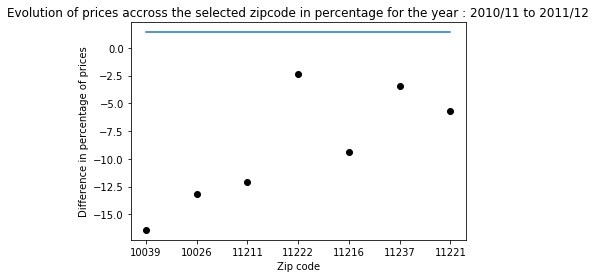

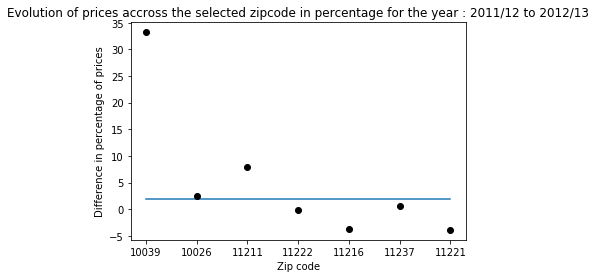

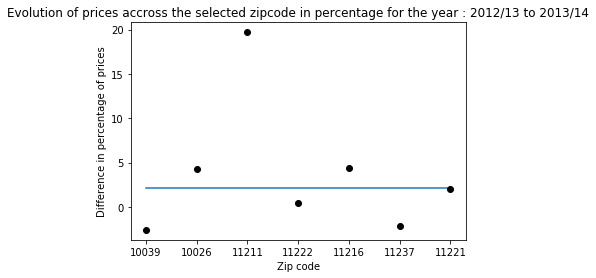

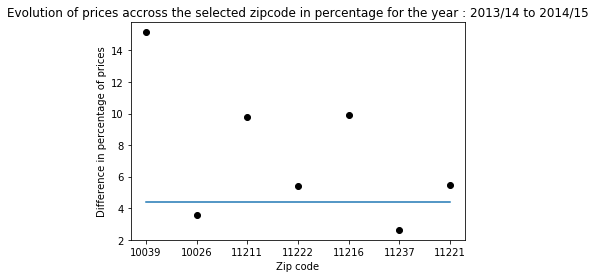

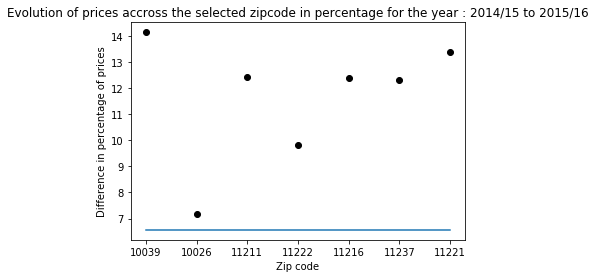

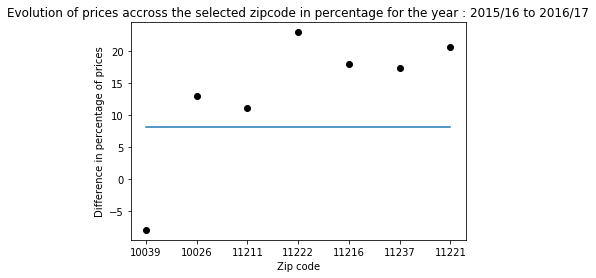

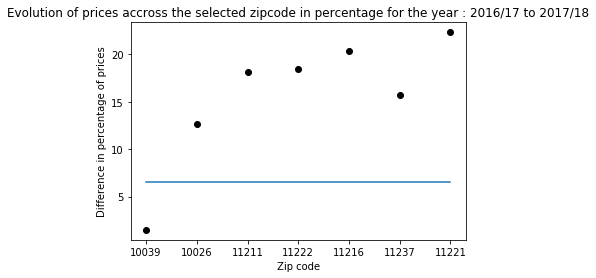

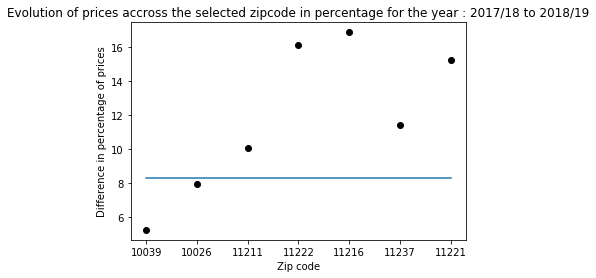

In [16]:
new2=new2.drop(['VALTYPE','Borough','Latitude','Longitude'],axis=1)

Datayear1=new2[new2['YEAR']=='2010/11']
Datayear1=Datayear1.drop(['YEAR'],axis=1)
Datayear1=Datayear1.reset_index(drop=True)
Datayear2=new2[new2['YEAR']=='2011/12']
Datayear2=Datayear2.drop(['YEAR'],axis=1)
Datayear2=Datayear2.reset_index(drop=True)
Datayear3=new2[new2['YEAR']=='2012/13']
Datayear3=Datayear3.drop(['YEAR'],axis=1)
Datayear3=Datayear3.reset_index(drop=True)
Datayear4=new2[new2['YEAR']=='2013/14']
Datayear4=Datayear4.drop(['YEAR'],axis=1)
Datayear4=Datayear4.reset_index(drop=True)
Datayear5=new2[new2['YEAR']=='2014/15']
Datayear5=Datayear5.drop(['YEAR'],axis=1)
Datayear5=Datayear5.reset_index(drop=True)
Datayear6=new2[new2['YEAR']=='2015/16']
Datayear6=Datayear6.drop(['YEAR'],axis=1)
Datayear6=Datayear6.reset_index(drop=True)
Datayear7=new2[new2['YEAR']=='2016/17']
Datayear7=Datayear7.drop(['YEAR'],axis=1)
Datayear7=Datayear7.reset_index(drop=True)
Datayear8=new2[new2['YEAR']=='2017/18']
Datayear8=Datayear8.drop(['YEAR'],axis=1)
Datayear8=Datayear8.reset_index(drop=True)
Datayear9=new2[new2['YEAR']=='2018/19']
Datayear9=Datayear9.drop(['YEAR'],axis=1)
Datayear9=Datayear9.reset_index(drop=True)

avD1=Datayear1.groupby(['POSTCODE']).mean()
avD1.reset_index(level=0, inplace=True)
avD1['POSTCODE']=avD1['POSTCODE'].astype(int)

avD2=Datayear2.groupby(['POSTCODE']).mean()
avD2.reset_index(level=0, inplace=True)
avD2['POSTCODE']=avD2['POSTCODE'].astype(int)

avD3=Datayear3.groupby(['POSTCODE']).mean()
avD3.reset_index(level=0, inplace=True)
avD3['POSTCODE']=avD3['POSTCODE'].astype(int)

avD4=Datayear4.groupby(['POSTCODE']).mean()
avD4.reset_index(level=0, inplace=True)
avD4['POSTCODE']=avD4['POSTCODE'].astype(int)

avD5=Datayear5.groupby(['POSTCODE']).mean()
avD5.reset_index(level=0, inplace=True)
avD5['POSTCODE']=avD5['POSTCODE'].astype(int)

avD6=Datayear6.groupby(['POSTCODE']).mean()
avD6.reset_index(level=0, inplace=True)
avD6['POSTCODE']=avD6['POSTCODE'].astype(int)

avD7=Datayear7.groupby(['POSTCODE']).mean()
avD7.reset_index(level=0, inplace=True)
avD7['POSTCODE']=avD7['POSTCODE'].astype(int)

avD8=Datayear8.groupby(['POSTCODE']).mean()
avD8.reset_index(level=0, inplace=True)
avD8['POSTCODE']=avD8['POSTCODE'].astype(int)

avD9=Datayear9.groupby(['POSTCODE']).mean()
avD9.reset_index(level=0, inplace=True)
avD9['POSTCODE']=avD9['POSTCODE'].astype(int)

sam=avD1['POSTCODE'].values.tolist()

val_dict = avD1.set_index('POSTCODE')['FULLVAL']
val_dict2 = avD2.set_index('POSTCODE')['FULLVAL']
val_dict3 = avD3.set_index('POSTCODE')['FULLVAL']
val_dict4 = avD4.set_index('POSTCODE')['FULLVAL']
val_dict5 = avD5.set_index('POSTCODE')['FULLVAL']
val_dict6 = avD6.set_index('POSTCODE')['FULLVAL']
val_dict7 = avD7.set_index('POSTCODE')['FULLVAL']
val_dict8 = avD8.set_index('POSTCODE')['FULLVAL']
val_dict9 = avD9.set_index('POSTCODE')['FULLVAL']

difference=[]
zipp=[]

for x in range(len(sam)):
    if avD9['POSTCODE'][x] in sam:
        index=sam.index(avD9['POSTCODE'][x])
        zipp.append(avD9['POSTCODE'][x])
        a=100*(avD9['FULLVAL'][x]-avD1['FULLVAL'][index])/avD1['FULLVAL'][index]
        difference.append(a)

        
d = {'Difference':difference,'POSTCODE':zipp}

datadiff=pd.DataFrame(d)

interzip=[10039,10026,11211,11222,11216,11237,11221]
str_zip=[]
for x in range(len(interzip)):
    str_zip.append(str(interzip[x]))





each=[[0,0,0,0,0,0,0,0],[0,0,0,0,0,0,0,0],[0,0,0,0,0,0,0,0],[0,0,0,0,0,0,0,0],[0,0,0,0,0,0,0,0],[0,0,0,0,0,0,0,0]
      ,[0,0,0,0,0,0,0,0]]

for x in range(len(interzip)):
    a=100*(val_dict2[interzip[x]]-val_dict[interzip[x]])/val_dict[interzip[x]]
    each[x][0]=a
    
for x in range(len(interzip)):
    a=100*(val_dict3[interzip[x]]-val_dict2[interzip[x]])/val_dict2[interzip[x]]
    each[x][1]=a

for x in range(len(interzip)):
    a=100*(val_dict4[interzip[x]]-val_dict3[interzip[x]])/val_dict3[interzip[x]]
    each[x][2]=a

for x in range(len(interzip)):
    a=100*(val_dict5[interzip[x]]-val_dict4[interzip[x]])/val_dict4[interzip[x]]
    each[x][3]=a

for x in range(len(interzip)):
    a=100*(val_dict6[interzip[x]]-val_dict5[interzip[x]])/val_dict5[interzip[x]]
    each[x][4]=a
    
for x in range(len(interzip)):
    a=100*(val_dict7[interzip[x]]-val_dict6[interzip[x]])/val_dict6[interzip[x]]
    each[x][5]=a
    
for x in range(len(interzip)):
    a=100*(val_dict8[interzip[x]]-val_dict7[interzip[x]])/val_dict7[interzip[x]]
    each[x][6]=a
    
for x in range(len(interzip)):
    a=100*(val_dict9[interzip[x]]-val_dict8[interzip[x]])/val_dict8[interzip[x]]
    each[x][7]=a
    

    
for x in range(len(moyperyear)):
    plt.figure()
    plt.plot(str_zip,[moyperyear[x],moyperyear[x],moyperyear[x],moyperyear[x],moyperyear[x],moyperyear[x],moyperyear[x]])
    plt.plot(str_zip,[each[0][x],each[1][x],each[2][x],each[3][x],each[4][x],each[5][x],each[6][x]], 'o', color='black');
    plt.xlabel('Zip code')
    plt.ylabel('Difference in percentage of prices')
    plt.title('Evolution of prices accross the selected zipcode in percentage for the year : '+dates[x]+' to '+dates[x+1])
    plt.show()






* The second type of visualization we've chosen to implement is a Choropleth map representing the evolution of the prices in each zip code. The reason this solution has been implemented is for readability, and they are perfect to try to establish gentrification in some neighborhoods

In [24]:
map_nyc = folium.Map(location=[40.745522, -73.992212],
                    zoom_start = 10)

folium.Marker([40.825513, -73.938200], popup='10039').add_to(map_nyc)
folium.Marker([40.802951, -73.953904], popup='10026').add_to(map_nyc)
folium.Marker([40.714460, -73.947961], popup='11211').add_to(map_nyc)
folium.Marker([40.730898, -73.951676], popup='11222').add_to(map_nyc)
folium.Marker([40.681365, -73.949692], popup='11216').add_to(map_nyc)
folium.Marker([40.703002, -73.919452], popup='11237').add_to(map_nyc)
folium.Marker([40.691506, -73.925890], popup='11221').add_to(map_nyc)

url='https://raw.githubusercontent.com/gdobler/nycep/master/d3/data'

zip_nyc=f'{url}/nyc-zip-code.json'
geo_json_data = json.loads(requests.get(zip_nyc).text)


"""
folium.GeoJson(geo_json_data,style_function=lambda feature: {
        'fillColor': '#ffff00',
        'color': 'black',
        'weight': 2,
        'dashArray': '5, 5'}).add_to(map_nyc)
"""


geoframe = pd.DataFrame(data=geo_json_data["features"])

sam=avD1['POSTCODE'].values.tolist()


zips = [int(entry["ZIP"]) for entry in geoframe["properties"]]

maskarray = [zipcode in sam for zipcode in zips]

finalthing = pd.DataFrame(geo_json_data)
finalthing = finalthing[maskarray]

finalJson = json.loads(finalthing.to_json())


finalJson["type"]="FeatureCollection"
finalJson["features"]=[pair[1] for pair in finalJson["features"].items()]



zips = [int(entry["ZIP"]) for entry in geoframe["properties"]]

newmaskarray = [zipcode in zipp for zipcode in zips]

newthing = pd.DataFrame(geo_json_data)
newthing = newthing[newmaskarray]

newMaskJson = json.loads(newthing.to_json())


newMaskJson["type"]="FeatureCollection"
newMaskJson["features"]=[pair[1] for pair in newMaskJson["features"].items()]

colorscale = branca.colormap.linear.YlOrRd_09.scale(
    datadiff.Difference.min(),
    round(datadiff.Difference.max()))

bins=[-50,-20-10,0,5,15,20,35,50]

colorscale3=colorscale.to_step(n=8,quantiles=bins)
colorscale3

val_dict_diff = datadiff.set_index('POSTCODE')['Difference']

folium.GeoJson(newMaskJson,
               name="New York Property prices evolution accross zipcodes",
               style_function=lambda x: {'weight':3 if int(x['properties']['ZIP']) in interzip else 1
                   ,'color':'#545453',
                    'fillColor':'#9B9B9B' if val_dict_diff[int(x['properties']['ZIP'])]==0 
                    else colorscale3(val_dict_diff[int(x['properties']['ZIP'])]),
                    'fillOpacity':0.2 if val_dict_diff[int(x['properties']['ZIP'])]==0 else 1
               },
               

).add_to(map_nyc)

folium.LayerControl().add_to(map_nyc)

map_nyc



* The third and final vizualaisation we implement is a heat map with time scale for the crimes, the reason for doing so is because we want to show with sucess that the number of crimes in the zip codes we ve selected as candidates for gentrifucation see less and less crimes througout the years.(Need to be zoomed on)

In [25]:
df_focus=df_focus.drop(['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD', 'OFNS_DESC',
       'LAW_CODE', 'LAW_CAT_CD', 'ARREST_BORO', 'ARREST_PRECINCT',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'X_COORD_CD',
       'Y_COORD_CD'],axis=1)
df_focus=df_focus.reset_index(drop=True)

a=df_focus.groupby(['Year'])

map_nyc_crime = folium.Map(location=[40.745522, -73.992212],
                    zoom_start = 10)


folium.Marker([40.825513, -73.938200], popup='10039').add_to(map_nyc_crime)
folium.Marker([40.802951, -73.953904], popup='10026').add_to(map_nyc_crime)
folium.Marker([40.714460, -73.947961], popup='11211').add_to(map_nyc_crime)
folium.Marker([40.730898, -73.951676], popup='11222').add_to(map_nyc_crime)
folium.Marker([40.681365, -73.949692], popup='11216').add_to(map_nyc_crime)
folium.Marker([40.703002, -73.919452], popup='11237').add_to(map_nyc_crime)
folium.Marker([40.691506, -73.925890], popup='11221').add_to(map_nyc_crime)

heat_crime=[]


for x in range(9):
    heat_df=df_focus[df_focus['Year']==(2010+x)]
    heat_df = heat_df[['Latitude', 'Longitude']]
    heat_df = heat_df.dropna(axis=0, subset=['Latitude','Longitude'])
    heat_data = [[row['Latitude'],row['Longitude']] for index, row in heat_df.iterrows()]
    heat_crime.append(heat_data)

hm = plugins.HeatMapWithTime(heat_crime,min_opacity=0.2, radius = 25, gradient={.4: 'blue', .65: 'lime', 1: 'red'},auto_play=True,max_opacity=0.8)
hm.add_to(map_nyc_crime)

map_nyc_crime



# 6. Discussion. Think critically about your creation

### What went well?

With this project, we were able to work on something that the three of us were interested in. We enjoyed making research and analyzing data about a topic that we didn't know much about beforehand and definitely learned alott about.

We were able to make different visualizations that we hadn't tried before and to find different ways of presenting data.

However, we are aware that this project is far from a big success, and the main point lies on the take-aways brought by our struggles and failures.


### What is still missing? What could be improved? Why?

Our first problem is in the analysis of the data. In fact, we had high expectations on what type of correlations/links we would find between the criterias and gentrification. In reality, the data was harder to exploit than expected since grouping price evolution in areas as large as zip codes, resulted in a "flatened-out" result where it is very hard to observe any substantial increase/decrease, due to the amount of properties (some might increase alot, but it will get lost in the average).

We also struggled finding additional datasets from NYC that were relevant to gentrification.

Secondly, we were unable to find crime data with zip codes. Therefore, it was very hard to put together the price and crime datasets without losing precision (we could have merged them by borough but it would have been too general, insignificant, and hard to utilize). Our intention to analyze those two criteria was therefore, harder to achieve. In addition to that, we wanted to make a Bookeh plot showing the evolution of violence and prices in the 7 Zip codes, but it was also impossible to do for the same reasons.

Moreover, we realize that our machine learning part did not achieve at all what we wanted it to do. The initial goal was to predict which zones would be affected by gentrification in the future, but we realized that our criteria could not serve as qualifiers as well as we thought they would.

As a final word, we would say that our initial idea was ambitious but we did not have enough initial skills and did not put enough time and ressources in the completion of our task.



# 7. Contributions. Who did what?

In our project the "main responsible" is the one that did one half of the task, the other half was made by the other group members.
Basic stats: For that part of the project it is impossible to have a main responsible since we all need to contribute to have the best strategy to analyze the datasets

Data Analysis: Sammy Steffensen Benomar and Kamal Bargach shared the work for that part.

Website: The main responsible for that part was Miguel Burstorf.

Visualizations and plots: The main respondible is Sammy Steffensen Benomar

Discussion: All group members contributed equall since it is important to discuss our results
Report: Kamal Bargach was the main responsible